Example of the process of doing DEMs for all orbits for a given observation of an AR – where we attempt to remove pointing shift/SAA/etc intervals using Reed Masek's correlator methods. 

Note: this will break while the JSOC is still down, because it requests an AIA file for use in the initial co-alignmnet :( 

Overview:

- Define orbits
- Run correlator and time interval selection
- Examine resulting intervals
- Manually establish a co-alignment shift between NuSTAR and AIA
- Automatically find co-alignment shifts + make regions for all other time intervals (note: this relies on the assumption that the COM is a good representation of the location of the brightest source, i.e. that the NuSTAR data is primarially one blob).
- Save AIA region files for NCCS input
- NOT IN THIS NOTEBOOK: YOU THEN TAKE THOSE AND MAKE AIA INPUTS ON THE NCCS
- Conduct AIA/NuSTAR DEMs as a function of time, given all the above
- Plot results.
- Print some stats about "left out" times.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import glob
from astropy.io import fits
from astropy import units as u
import importlib
import pathlib

#Path to top-level do-dem directory - edit for your system.
path_to_dodem = '/Users/jmdunca2/do-dem/'
from sys import path as sys_path
sys_path.append(path_to_dodem+'/dodem/')

import nustar_dem_prep as nu
import initial_analysis as ia
import orbit_auto as oa

Pick your obsid directories, and make some decisions about time.

In [2]:
id_dirs = ['/Users/jmdunca2/nustar/apr-2021/20615001001/',
           '/Users/jmdunca2/nustar/apr-2021/20615002001/',
           '/Users/jmdunca2/nustar/apr-2021/20615003001/',
           '/Users/jmdunca2/nustar/apr-2021/20615004001/',
           '/Users/jmdunca2/nustar/apr-2021/20615005001/']

obsids=['20615001001','20615002001','20615003001','20615004001','20615005001']

#Name your working directory
working_dir='./initial_dem_apr21/'

#Make a new working directory for prepped data/etc if it doesn't yet exist
save_path = pathlib.Path(working_dir)
if not save_path.exists():
    save_path.mkdir()

#timestep for examining data (making correlator object)
t_corr = 2

#minimum length of suborbit
min_t = 30

#minimum number of steps needed in a sufficiently-sized suborbit, based on the above. 
min_step = int(np.ceil(min_t/t_corr))

We want to split the data time interval into "suborbits" that each contain no correlator-identified pointing shifts, or SAAs. 

There will be some minimum suborbit time for which we can make a useful DEM (i.e. sufficient NuSTAR statistics). This will depend on observation livetime, so we want to make sure it can be changed (via min_step keyword).

To do this we will create correlator objects for FPMB,A. This also will make correlator overview plots (saved), and make a good interval comparison plot. This takes about 3m the first time, and ~7s once you have saved your centroid files for each fpm.

Let's get sub-orbits! To combine FPMA, FPMB information, we select for only times where both FPM come out "good". 

/Users/jmdunca2/nustar/apr-2021/20615001001/
d
Loading coordinates from pickle: ./centroid_coordinates/d_20615001001_fpmA_3s_RAW_centroid.pkl
d
Loading coordinates from pickle: ./centroid_coordinates/d_20615001001_fpmB_3s_RAW_centroid.pkl
2021-04-29 14:54:18.501558+00:00
2021-04-29 15:04:50.501558+00:00

2021-04-29 15:05:44.501558+00:00
2021-04-29 15:14:46.501558+00:00

2021-04-29 15:32:44.501558+00:00
2021-04-29 15:45:48.501558+00:00

2021-04-29 15:46:02.501558+00:00
2021-04-29 15:53:32.501558+00:00


Fast Method Counts:  20.0
2021-04-29 14:54:20+00:00
2021-04-29 14:59:05+00:00
Using grades 0-4 NuSTAR events.

Max NuSTAR Energy:  18.399999618530273
Highest energy range: [6.0, 10]
Total Above:  1
Above Energies:  [18.39999962]
ATC: 8.25

Using grades 0-4 NuSTAR events.

Max NuSTAR Energy:  24.119998931884766
Highest energy range: [6.0, 10]
Total Above:  1
Above Energies:  [24.11999893]
ATC: 14.0

8.25  counts in FPM A   14.0  counts in FPM B . Total: 22.25  Exiting.
Found Time Interval

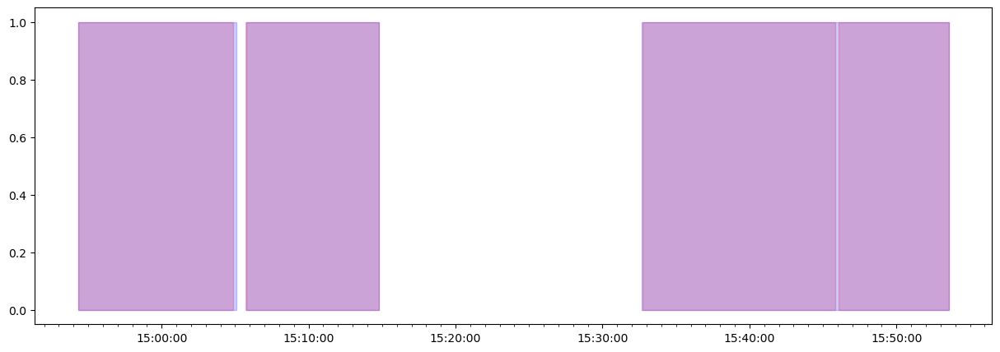

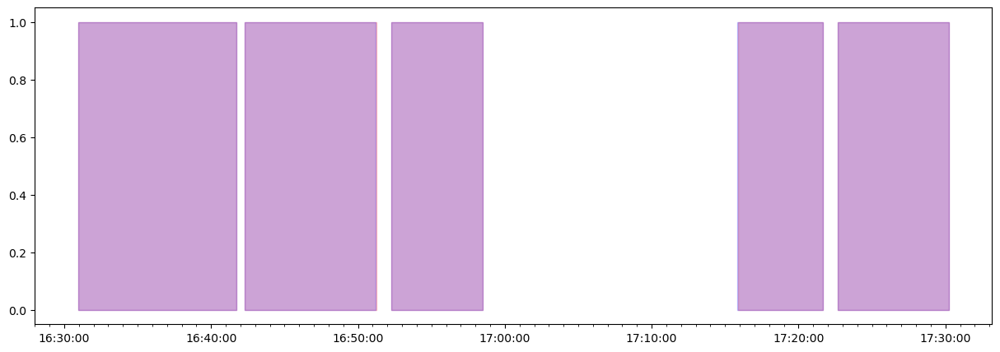

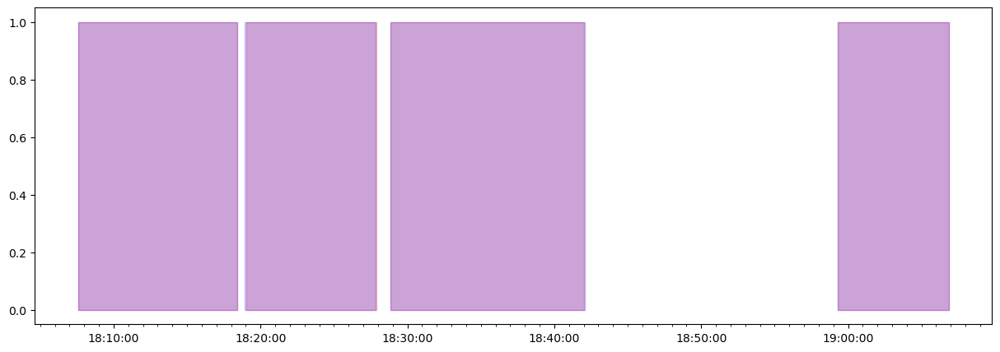

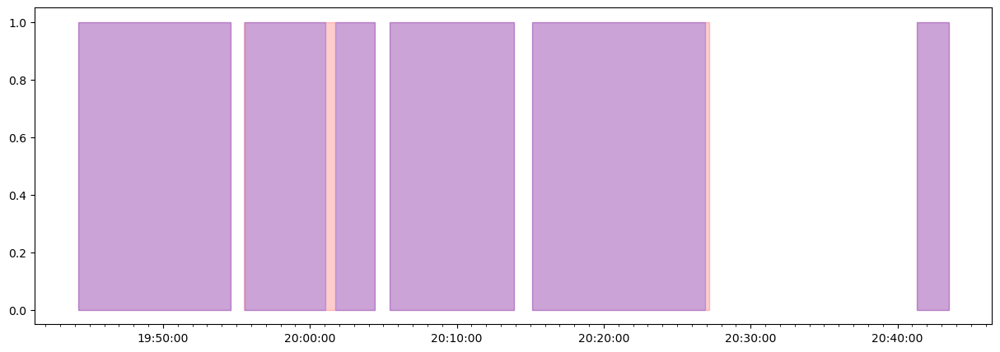

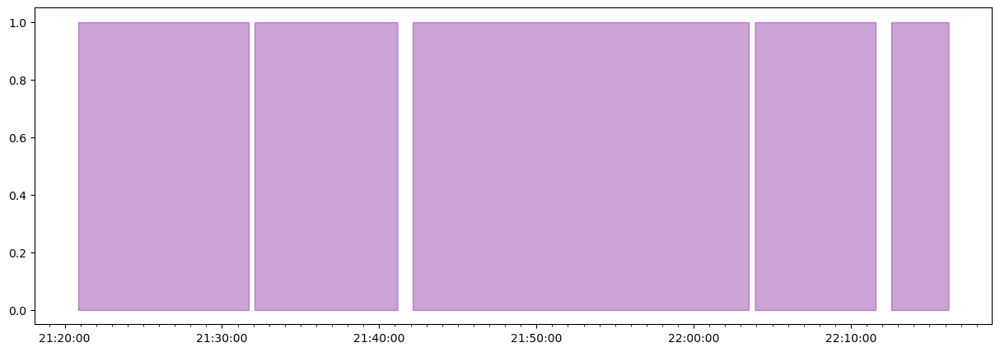

In [3]:
importlib.reload(oa)

all_bad_grouptimes=[]
badgrouptimes=[]
orbittimes = []
badintervals=[]
for id in id_dirs:
    print(id)
    both_groupinds, both_grouptimes, bad_groups, bad_grouptimes, bad_ids = oa.get_suborbits(id, t_corr, min_step, plot=True)
    all_bad_grouptimes.extend(bad_grouptimes)
    badgrouptimes.append(bad_grouptimes)
    bad_suborbits, all_intervals = oa.get_suborbit_intervals(both_grouptimes, id, working_dir, erange=[6.,10], 
                                                             force_both_fpm_always=True, shush=True)  
    if bad_suborbits:
        badintervals.append(bad_suborbits)
    if all_intervals:
        orbittimes.append(all_intervals)
    print('')

data = {'bad_grouptimes': badgrouptimes,
        'all_bad_grouptimes': all_bad_grouptimes,
        'bad_intervals': badintervals,
        'orbit_times': orbittimes}

import pickle

file=working_dir+'_interval_info.pickle'
with open(file, 'wb') as f:
    pickle.dump(data, f, pickle.HIGHEST_PROTOCOL)
    

In [4]:
print('Number of Bad Intervals (pointing shifts, SAA, etc): ', len(all_bad_grouptimes))
print('These are: ')
for b in all_bad_grouptimes:
    print(b[0].strftime('%H-%M-%S'), b[1].strftime('%H-%M-%S'))
    
print('')
count=0
for b in badintervals:
    for int in b:
        count+=1
print('Number of Intervals that failed time interval selection: ', count)
print('These are: ')
for b in badintervals:
    for int in b:
        print(int[0].strftime('%H-%M-%S'), int[1].strftime('%H-%M-%S'))
    print('')

Number of Bad Intervals (pointing shifts, SAA, etc):  20
These are: 
15-04-52 15-05-42
15-14-48 15-32-42
15-45-50 15-46-00
16-41-44 16-42-16
16-51-14 16-52-14
16-58-32 17-15-50
17-21-42 17-22-38
18-18-26 18-19-00
18-27-52 18-28-48
18-42-04 18-59-16
19-54-36 19-55-32
20-01-06 20-01-42
20-04-28 20-05-24
20-13-54 20-15-06
20-26-54 20-41-18
21-31-44 21-32-02
21-41-08 21-42-04
22-03-32 22-03-52
22-11-36 22-12-32
22-16-12 22-16-12

Number of Intervals that failed time interval selection:  0
These are: 


Now, we want to take these suborbits and run time interval selection within each!

Options when finding intervals:

- __erange__ : set to highest energy range you want to use as a DEM input (higher energies = worse statistics)
- __countmin__: number of real counts you want in each DEM interval.
- __minimum_seconds__: set to a minimum duration for the DEM time intervals (optional, omit to not set a minimum). Effective minimum if not set is 5s (time binning of lightcurves). You could change this too by editing the lightcurve code. 
- __lctype__ : what kind of counts are you going to include? Options:
    
            'grade0' – grade 0 (FPMA,B sum)
            'grade04' - grade 0-4  (FPMA,B sum)
            'corr14' - grade 0 - (1/4)*grades 21-24 (FPMA, B sum)
            'corr54' - grade 0-4 - (5/4)*grades 21-24 (FPMA, B sum)
            
- __fast_min_factor__: factor multiplied by countmin when making an initial estimate of how long an interval is needed (fast method, without region selection). Accounts for the fact that some emission may fall outside the region. Adjust as needed; a larger factor will make this more time-efficient (less chance you'll make spectral data products for any too-small time intervals + have to repeat), but a smaller factor will get you closer to maximally-fine sampling in time.

Note on finding intervals: this is *slow* – it takes between 40 minutes to 3 hours on my machine for a single ~1 hr orbit, due to the need to make NuSTAR spectral data products for each interval. The brighter the source, the finer the time sampling, the longer it takes. But the spectral data products need to be made anyway to do DEMs, so it isn't a total waste. 

Now that we've found time intervals for each sub-orbit, let's print them all to inspect, and also check what % of the total NuSTAR emission is in the region as a function of time. This is also a nice way to visualize the relative length of the different suborbits and time intervals within them.

0 - 0 14-54-20 14-59-05
0 - 1 14-59-05 15-02-25
0 - 2 15-02-25 15-03-40
0 - 3 15-03-40 15-04-10
0 - 4 15-04-10 15-04-50

1 - 0 15-05-45 15-07-00
1 - 1 15-07-00 15-08-00
1 - 2 15-08-00 15-09-05
1 - 3 15-09-05 15-09-35
1 - 4 15-09-35 15-10-05
1 - 5 15-10-05 15-10-35
1 - 6 15-10-35 15-11-05
1 - 7 15-11-05 15-12-25
1 - 8 15-12-25 15-14-45

2 - 0 15-32-45 15-33-20
2 - 1 15-33-20 15-34-00
2 - 2 15-34-00 15-34-30
2 - 3 15-34-30 15-35-10
2 - 4 15-35-10 15-35-40
2 - 5 15-35-40 15-36-10
2 - 6 15-36-10 15-36-40
2 - 7 15-36-40 15-38-45
2 - 8 15-38-45 15-39-50
2 - 9 15-39-50 15-40-45
2 - 10 15-40-45 15-42-35
2 - 11 15-42-35 15-44-55
2 - 12 15-44-55 15-45-45

3 - 0 15-46-05 15-46-35
3 - 1 15-46-35 15-47-05
3 - 2 15-47-05 15-47-55
3 - 3 15-47-55 15-49-35
3 - 4 15-49-35 15-53-30

4 - 0 16-31-00 16-37-40
4 - 1 16-37-40 16-41-40

5 - 0 16-42-20 16-46-00
5 - 1 16-46-00 16-51-10

6 - 0 16-52-20 16-53-15
6 - 1 16-53-15 16-54-20
6 - 2 16-54-20 16-55-05
6 - 3 16-55-05 16-58-30

7 - 0 17-15-55 17-16-25
7 - 1 

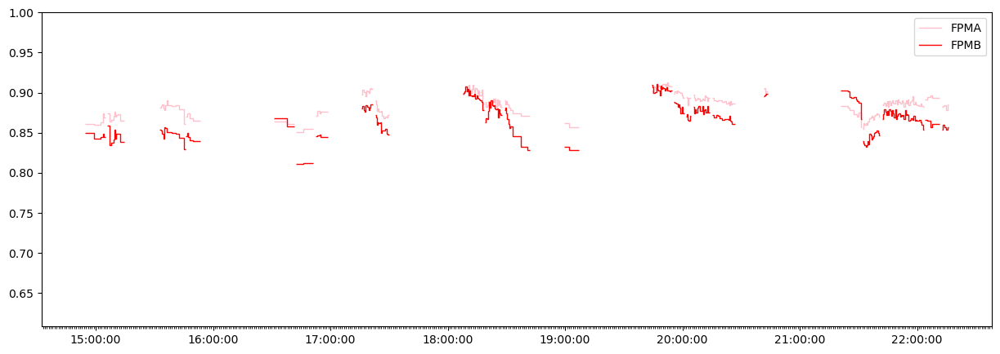

In [3]:
importlib.reload(oa)

all_time_intervals, all_time_intervals_list = oa.find_all_intervals(working_dir)

allpercentsA, allpercentsB = oa.check_region_emission(all_time_intervals, working_dir, grade='0_4', plot=True)

In order to do DEMs for each of these time intervals we will need to, for each suborbit, co-align NuSTAR and AIA to get an AIA region corresponding to the NuSTAR region. NOTE: currently, this ends up outputting the FPMB shifted region as the AIA region – worth thinking in the future about whether to do this separately for the FPM in some scenarios?

We first manually establish a shift for the lead (first) time interval of the first sub-orbit:

./initial_dem_may18/16-00-10_16-00-55/nu80410201001A06_0_4_p_cl_sunpos_COM_region.reg


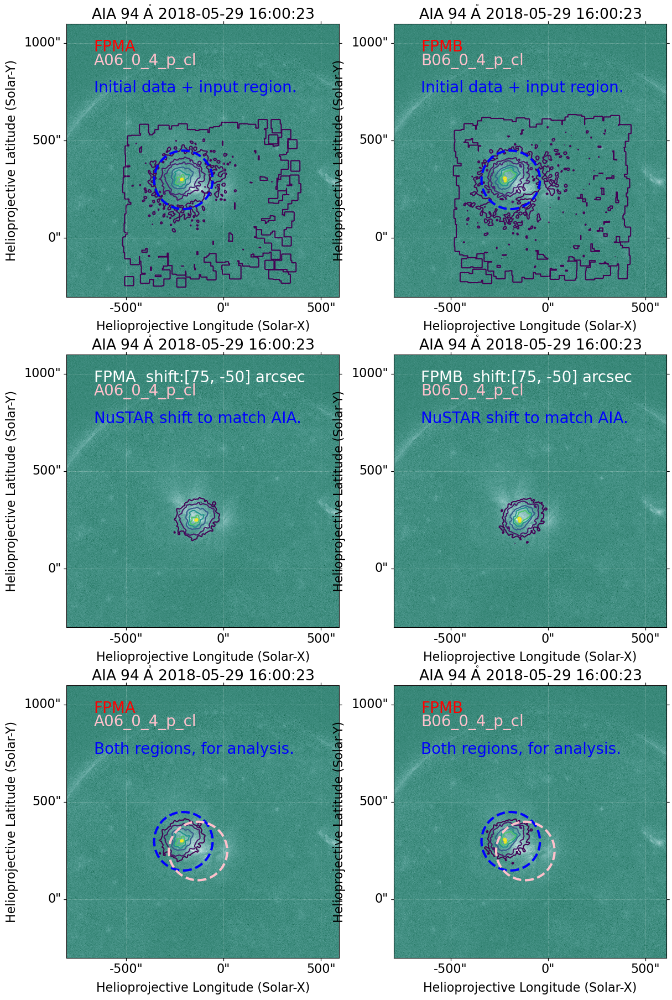

In [28]:
importlib.reload(oa)
import pickle

time_interval = all_time_intervals[0][0]
nushift=[75, -50]

#(first run)
#dict = oa.nu_aia_coalign(time_interval, working_dir, nushift, save_dict=True)

time=time_interval
timestring = time[0].strftime('%H-%M-%S')
stopstring = time[1].strftime('%H-%M-%S')
timestring=timestring+'_'+stopstring
file=working_dir+timestring+'/'+timestring+'_aia_region.pickle'
try:
    with open(file, 'rb') as f:
        data = pickle.load(f)
    dict = oa.nu_aia_coalign(time_interval, working_dir, nushift, save_dict=True, input_aia = data['map'])
except FileNotFoundError: 
    print('what')


Next, we use that time interval as a reference interval, and we automatically find co-alignment shifts for every other sub-orbit. This is done by taking the difference between the reference interval COM and each new COM, and adujusting the co-alignment shift based on that difference. Also, an adjustment is made for solar rotation based on the time difference between the current and reference intervals.

Note that the regions, aia maps, shifts, etc. are saved (pickled) in each time interval directory (*_aia_region.pickle).

KeyboardInterrupt: 

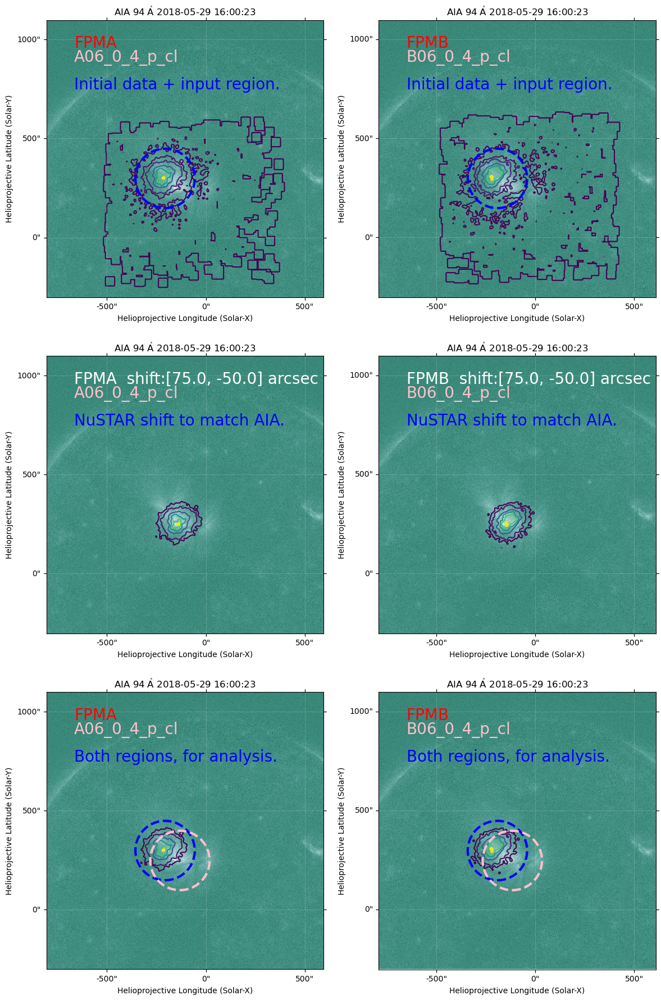

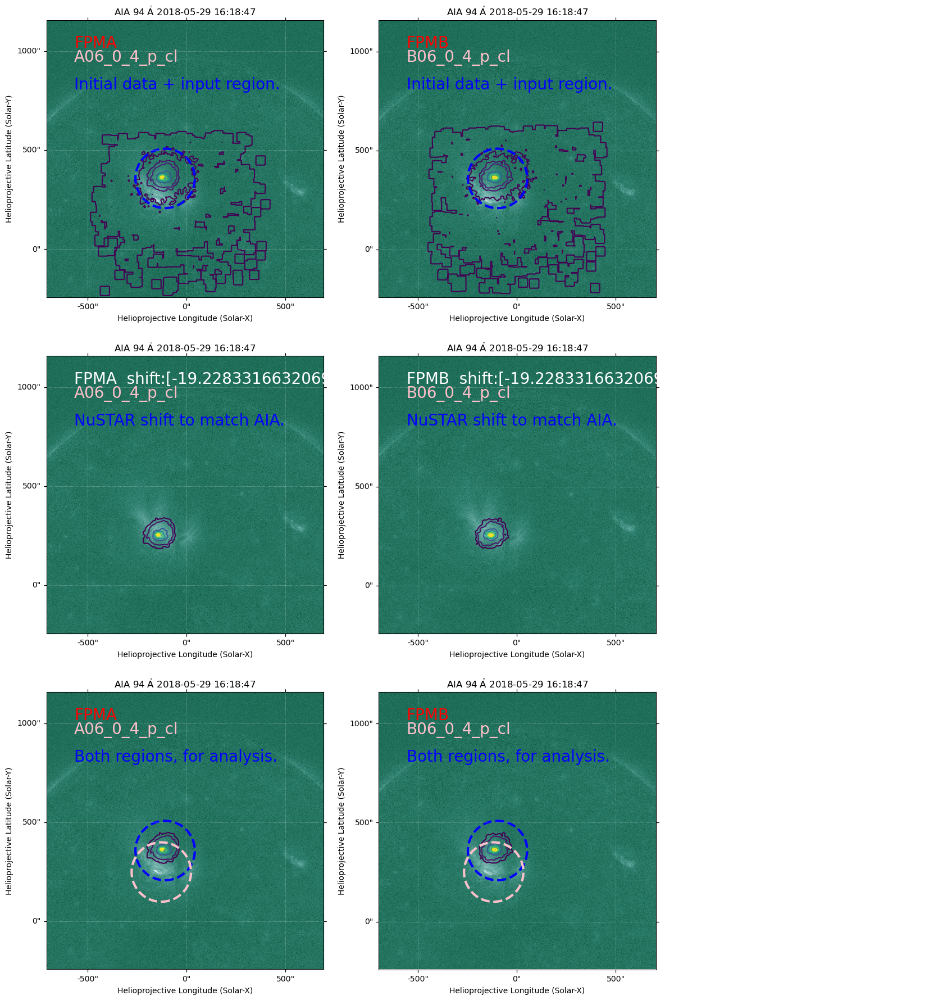

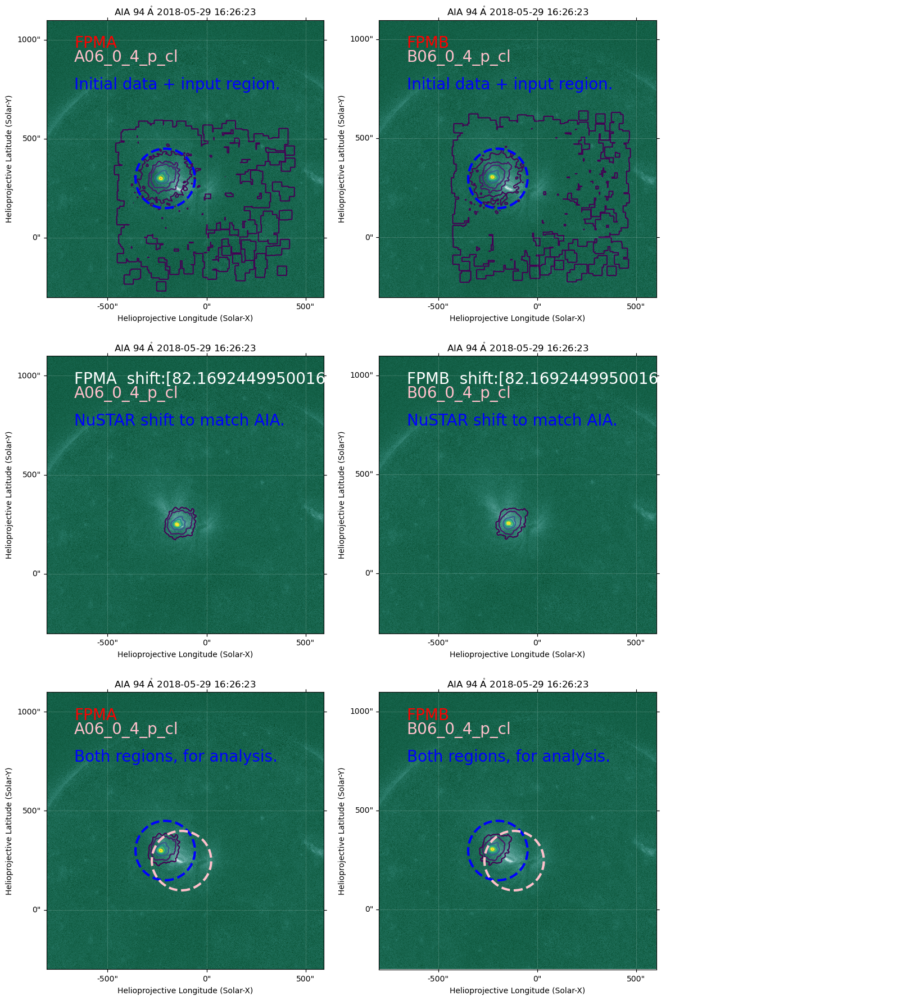

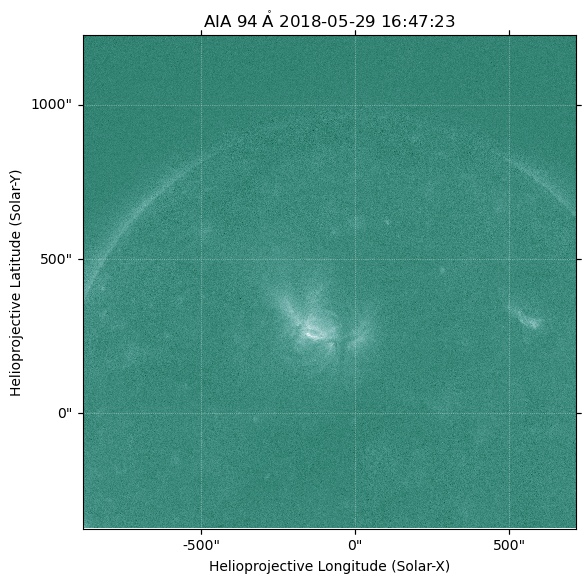

In [9]:
importlib.reload(oa)
lead_intervals=[]
for at in all_time_intervals:
    lead_intervals.append(at[0])

reference_interval=time_interval

oa.coalign_based_on_prior(lead_intervals, working_dir, reference_interval)

Now, we want to make AIA region reference files for EVERY TIME INTERVAL (not just the first in each sub-orbit). The AIA regions for each lead time interval are also used for subsequent intervals in that suborbit. The files are placed into directories based on what nustar orbit
(OBSID-labled) they occur during – this is useful on the NCCS, due to the organization of the AIA data. 

In [ ]:
importlib.reload(oa)
suborbit_dirs = oa.make_all_aia_dicts(all_time_intervals, working_dir)

Copy each of the below directories onto the NCCS, and then run AIA data prep for each. When done, re-copy them back for use in DEMs.

In [ ]:
print(set(suborbit_dirs))

In [12]:
#What instruments are you using?
#---------------------------------
aia=True
#---------------------------------
eis=False
xrt=False
#---------------------------------
plot=False
#---------------------------------
nustar=True
#If nustar is being used, here are the chosen energy ranges:
nuenergies=[[2.5,3.5],[3.5,6.], [6.,10.]]
#---------------------------------

#---------------------------------
#---------------------------------
#What temperature range would you like to use? (units: log(T))
minT=5.6
maxT=7.2

#Would you prefer to plot temperatures in MK, or the default (logT)
plotMK=False
#---------------------------------
#---------------------------------

name='initial_dem_apr21'

In [16]:
#AIA Error table - set path to location in your system.
#errortab='/Users/jmdunca2/ssw/sdo/aia/response/aia_V3_error_table.txt'

#Sunpy data directory (or wherever else you store your downloaded AIA data)
#sunpy_dir='/Users/jmdunca2/sunpy/data/'

#Path to top-level do-dem directory - edit for your system.
path_to_dodem = '/Users/jmdunca2/do-dem/'

import dodem

importlib.reload(oa)

for o in range(0, len(obsids)):

    datapath=id_dirs[o]
    gtifile=datapath+'event_cl/nu'+obsids[o]+'A06_gti.fits'
    regfile=path_to_dodem+'starter_region.reg'

    suborbit_dir = working_dir+'/orbit_'+obsids[o]+'/'

    time_intervals = orbittimes[o]

    for time in time_intervals:
        print(time)

        data, bl, tr = oa.read_interval_dicts(time, where=suborbit_dir, bltr=True)
    
        dodem.dodem(time, bl, tr, xrt=xrt, aia=aia, nustar=nustar, name=name,
                                    plotMK=plotMK, minT=minT, maxT=maxT,
                                    plotresp=False, working_directory=working_dir,
                                    default_err=0.2, path_to_dodem=path_to_dodem,
            
                                    #demreg related
                                    rgt_fact=1.2, max_iter=30,
                                    reg_tweak=1, gloci=1, mc_in=True, mc_rounds=100, 
                                    
                                    #nustar related 
                                    combine_fpm=True, nuenergies=nuenergies, make_nustar=True, 
                                    datapath=datapath, gtifile=gtifile,
                                    COM_nustar_region=True, nuclobber=False, edit_regfile=True,
            
                                    #aia related
                                    load_prepped_aia=data)

[datetime.datetime(2018, 5, 29, 16, 0, 10)
 datetime.datetime(2018, 5, 29, 16, 0, 55)]
Start Time:  2018-05-29 16:00:10
Stop Time:  2018-05-29 16:00:55

ARF File:  ['./initial_dem_may18/16-00-10_16-00-55/nu80410201001A06_0_p_sr.arf']
RMF File:  ['./initial_dem_may18/16-00-10_16-00-55/nu80410201001A06_0_p_sr.rmf']
PHA File:  ['./initial_dem_may18/16-00-10_16-00-55/nu80410201001A06_0_p_sr.pha']

Max NuSTAR Energy:  8.079999923706055
ARF File:  ['./initial_dem_may18/16-00-10_16-00-55/nu80410201001B06_0_p_sr.arf']
RMF File:  ['./initial_dem_may18/16-00-10_16-00-55/nu80410201001B06_0_p_sr.rmf']
PHA File:  ['./initial_dem_may18/16-00-10_16-00-55/nu80410201001B06_0_p_sr.pha']

Max NuSTAR Energy:  7.199999809265137

A94 :     2.95   0.59  20 %
A131 :     21.82   4.36  20 %
A171 :     552.73   110.55  20 %
A193 :     724.21   144.84  20 %
A211 :     273.31   54.66  20 %
A335 :     20.35   4.07  20 %
2.5-3.5keV A+B :     12097.93   2426.03  20 %
3.5-6.0keV A+B :     1885.19   383.44  20 %
6.0-10

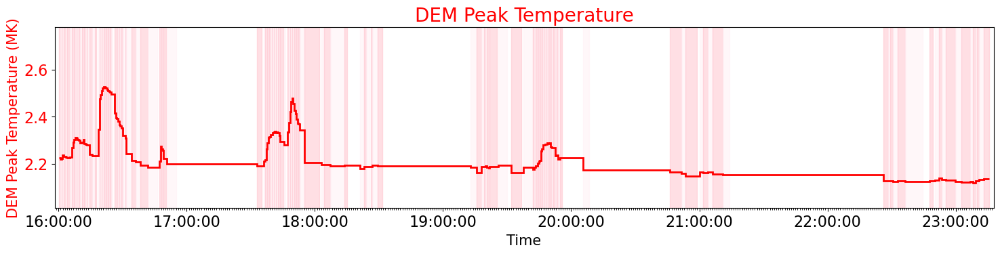

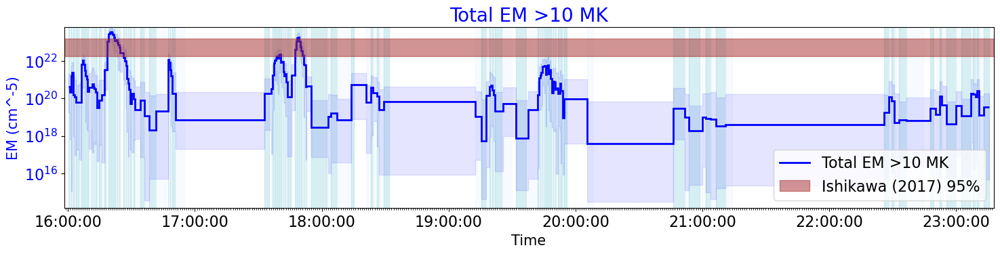

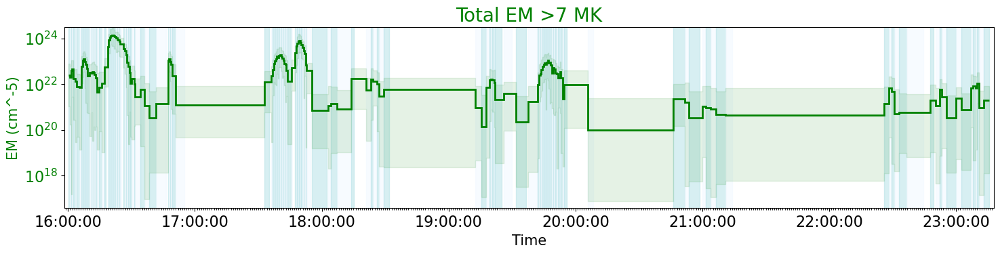

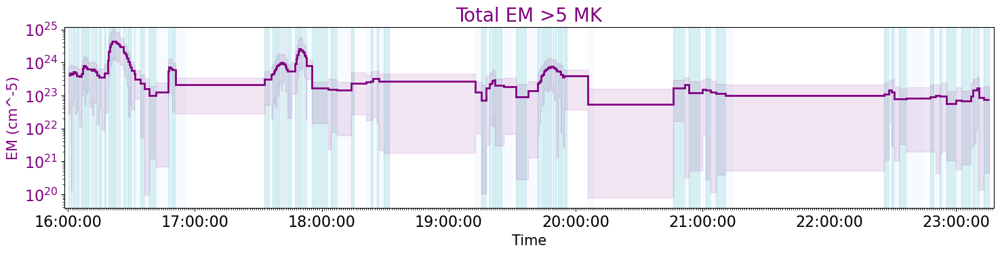

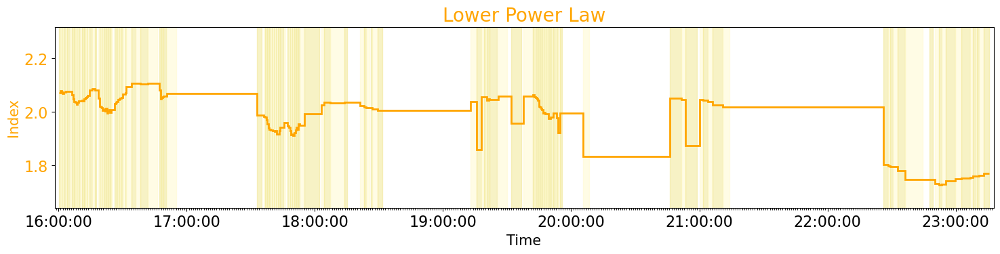

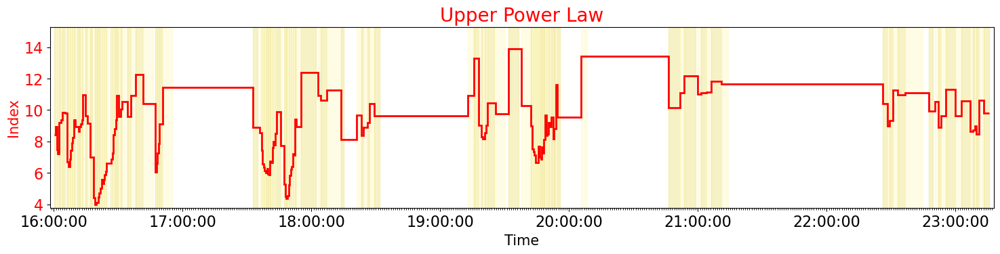

In [17]:
import visualize_dem_results as viz

time_intervals = all_time_intervals_list

importlib.reload(viz)
vals = viz.get_DEM_timeseries(time_intervals, working_dir, minT, maxT, name)    


peaks=vals['peaks']
peaksmk = [10**m1/1e6 for m1 in peaks]    

backcolors=['pink', 'lavenderblush']
color='Red'
    
viz.pretty_orbit_timeseries(time_intervals, peaksmk, 'DEM Peak Temperature (MK)', 'DEM Peak Temperature',
                        color, backcolors, working_dir=working_dir)


backcolors=['powderblue', 'aliceblue']
color='Blue'

above10s=np.array(vals['above10s'])
above10s_=above10s[:,0]

viz.pretty_orbit_timeseries(time_intervals, above10s_, 'EM (cm^-5)', 'Total EM >10 MK',
                        color, backcolors, error=True, quantity_low=above10s[:,1], quantity_high=above10s[:,2], 
                        ylog=True, comparisonbar=True, comp_band=[1.8e22, 1.5e23, 'Ishikawa (2017) 95%'],
                            working_dir=working_dir)

backcolors=['powderblue', 'aliceblue']
color='Green'

above7s=np.array(vals['above7s'])
above7s_=above7s[:,0]

viz.pretty_orbit_timeseries(time_intervals, above7s_, 'EM (cm^-5)', 'Total EM >7 MK',
                        color, backcolors, error=True, quantity_low=above7s[:,1], quantity_high=above7s[:,2], 
                        ylog=True, working_dir=working_dir)

backcolors=['powderblue', 'aliceblue']
color='Purple'

above5s=np.array(vals['above5s'])
above5s_=above5s[:,0]

viz.pretty_orbit_timeseries(time_intervals, above5s_, 'EM (cm^-5)', 'Total EM >5 MK',
                        color, backcolors, error=True, quantity_low=above5s[:,1], quantity_high=above5s[:,2], 
                        ylog=True, working_dir=working_dir)


backcolors=['khaki', 'lemonchiffon']
color='Orange'

val=np.array(vals['low_powers'])

viz.pretty_orbit_timeseries(time_intervals, val, 'Index', 'Lower Power Law',
                        color, backcolors, error=False, working_dir=working_dir)


backcolors=['khaki', 'lemonchiffon']
color='Red'

val=np.array(vals['hi_powers'])*-1

viz.pretty_orbit_timeseries(time_intervals, val, 'Index', 'Upper Power Law',
                        color, backcolors, error=False, working_dir=working_dir)



Investigating anomalous times (see: third interval in fourth orbit with very low low power law index), at least some are correlated with what appear to be pointing shifts not identified by the correlator method – they are visible in the correlator plots, but fall below the threshold. We should keep an eye on this moving forward (as we try out these methods with other observations) to see if there is a different optimal threshold. 

Now, we want to examine some "left-out times".


In [50]:
import pickle

file=working_dir+'_interval_info.pickle'
with open(file, 'rb') as f:
        data = pickle.load(f)

orbit_times=data['orbit_times']
bad_intervals=data['bad_intervals']
bad_grouptimes=data['bad_grouptimes']

print('Number of Bad Intervals (pointing shifts, SAA, etc): ', len(bad_grouptimes))
print('Those of length greater than our minimum interval time are: ')
for b in bad_grouptimes:
    for gt in b:
        dur=(gt[1]-gt[0])
        #print(b[0].strftime('%H-%M-%S'), b[1].strftime('%H-%M-%S'), 'duration: ', dur)
        if dur.total_seconds() > min_t:
            print(gt[0].strftime('%H-%M-%S'), gt[1].strftime('%H-%M-%S'), 'duration: ', dur)
    
print('')
count=0
for b in bad_intervals:
    for int in b:
        count+=1
print('Number of Intervals that failed time interval selection: ', count)
print('These are: ')
for b in bad_intervals:
    for int in b:
        print(int[0].strftime('%H-%M-%S'), int[1].strftime('%H-%M-%S'))
    print('')
    

Number of Bad Intervals (pointing shifts, SAA, etc):  5
Those of length greater than our minimum interval time are: 
16-17-49 16-18-37 duration:  0:00:48
16-25-13 16-26-15 duration:  0:01:02
16-46-21 16-47-09 duration:  0:00:48
17-35-09 17-35-57 duration:  0:00:48
17-46-13 17-47-17 duration:  0:01:04
18-02-19 18-03-01 duration:  0:00:42
18-15-07 18-21-01 duration:  0:05:54
19-11-46 19-12-38 duration:  0:00:52
19-25-16 19-25-52 duration:  0:00:36
19-30-04 19-30-42 duration:  0:00:38
19-36-44 19-37-34 duration:  0:00:50
19-55-56 20-05-36 duration:  0:09:40
20-58-56 20-59-56 duration:  0:01:00
22-25-09 22-26-01 duration:  0:00:52
22-49-31 22-50-19 duration:  0:00:48

Number of Intervals that failed time interval selection:  9
These are: 
19-09-28 19-10-14
19-10-18 19-11-44
19-30-44 19-31-22

21-14-06 21-15-24

22-22-47 22-25-07
22-45-07 22-47-33
23-15-55 23-16-57
23-17-01 23-17-39
23-17-51 23-18-33



In [54]:
#Let's do time interval selection on the bad intervals and see what happens!
#Caveat – we want to save the files somewhere so they won't be found by our standard oa.find_all_intervals.

new_working_dir=working_dir+'/snowflakes/'
#Make a new working directory for prepped data/etc if it doesn't yet exist
save_path = pathlib.Path(new_working_dir)
if not save_path.exists():
    save_path.mkdir()

failed_intervals=[]
sucesses=[]
for b in range(0, len(bad_grouptimes)):
    gts = bad_grouptimes[b]
    long_enough=[]
    for gt in gts:
        dur=(gt[1]-gt[0])
        #print(b[0].strftime('%H-%M-%S'), b[1].strftime('%H-%M-%S'), 'duration: ', dur)
        if dur.total_seconds() > min_t:
            print(dur)
            long_enough.append(gt)
            
    id=id_dirs[b]
    bad_suborbits, all_intervals = oa.get_suborbit_intervals(long_enough, id, new_working_dir, erange=[6.,10], 
                                                             force_both_fpm_always=True, shush=True) 

    if bad_suborbits:
        failed_intervals.append(bad_suborbits)
    if all_intervals:
        sucesses.append(all_intervals)


Fast Method Counts:  29.0
2018-05-29 16:17:50+00:00
2018-05-29 16:17:55+00:00
Time interval shorter than chosen minimum of  30  seconds.
Extending to a  30  second-long interval.
Using grades 0-4 NuSTAR events.

Max NuSTAR Energy:  9.760000228881836
ATC: 46.5

46.5  counts just in FPM A
Making products for FPM B  as well, as you set force_both_fpm==True.
Using grades 0-4 NuSTAR events.

Max NuSTAR Energy:  9.5600004196167
ATC: 63.0

46.5  counts in FPM A   63.0  counts in FPM B . Total: 109.5  Exiting.
Found Time Interval 16-17-50 16-18-20
Counts:  109.5

Fast Method Counts:  28.25
2018-05-29 16:18:20+00:00
2018-05-29 16:18:20+00:00
Time interval shorter than chosen minimum of  30  seconds.
Extending to a  30  second-long interval.
Remainder of orbit <  30  seconds from current start.
Combining this last bit with prior interval.
ARF File:  ['./initial_dem_may18//snowflakes/16-17-50_16-18-35/nu80410201001A06_0_p_sr.arf']
RMF File:  ['./initial_dem_may18//snowflakes/16-17-50_16-18-35/nu

In [65]:
for ff in failed_intervals:
    for f in ff:
        print(type(f[0]))
        print(f[0].strftime('%H-%M-%S'), f[1].strftime('%H-%M-%S'), 'duration: ', (f[1]-f[0]))

print('')
for ff in sucesses:
    for f in ff:
        print(type(f[0].datetime))
        print(f[0].strftime('%H-%M-%S'), f[1].strftime('%H-%M-%S'), 'duration: ', (f[1].datetime-f[0].datetime))

<class 'datetime.datetime'>
18-02-19 18-03-01 duration:  0:00:42
<class 'datetime.datetime'>
18-15-07 18-21-01 duration:  0:05:54
<class 'datetime.datetime'>
19-11-46 19-12-38 duration:  0:00:52
<class 'datetime.datetime'>
19-25-16 19-25-52 duration:  0:00:36
<class 'datetime.datetime'>
19-30-04 19-30-42 duration:  0:00:38
<class 'datetime.datetime'>
19-36-44 19-37-34 duration:  0:00:50
<class 'datetime.datetime'>
20-58-56 20-59-56 duration:  0:01:00
<class 'datetime.datetime'>
22-25-09 22-26-01 duration:  0:00:52
<class 'datetime.datetime'>
22-49-31 22-50-19 duration:  0:00:48

<class 'datetime.datetime'>
16-17-50 16-18-35 duration:  0:00:45
<class 'datetime.datetime'>
16-25-15 16-25-45 duration:  0:00:30
<class 'datetime.datetime'>
16-25-45 16-26-15 duration:  0:00:30
<class 'datetime.datetime'>
16-46-25 16-47-05 duration:  0:00:40
<class 'datetime.datetime'>
17-35-10 17-35-55 duration:  0:00:45
<class 'datetime.datetime'>
17-46-15 17-46-45 duration:  0:00:30
<class 'datetime.datetim

In [61]:
all_intervals

[]

In [ ]:
#single DEM test


# #AIA Error table - set path to location in your system.
# errortab='/Users/jmdunca2/ssw/sdo/aia/response/aia_V3_error_table.txt'

# #Sunpy data directory (or wherever else you store your downloaded AIA data)
# sunpy_dir='/Users/jmdunca2/sunpy/data/'

# #Path to top-level do-dem directory - edit for your system.
# path_to_dodem = '/Users/jmdunca2/do-dem/'

# import dodem

# datapath=id_dir
# gtifile=datapath+'event_cl/nu'+obsid+'A06_gti.fits'
# regfile=path_to_dodem+'starter_region.reg'


# ind=0
# time = both_grouptimes[ind]
# timestring = time[0].strftime('%H-%M-%S')
# stopstring = time[1].strftime('%H-%M-%S')
# timestring=timestring+'_'+stopstring
# #suborbit directory
# suborbit_dir=working_dir+'/suborbit_'+timestring

# time_interval=time_intervals[0]
# data, bl, tr = read_interval_dicts(time_interval, where=suborbit_dir, bltr=True)


# importlib.reload(dodem)
# #NuSTAR and AIA DEM
# dodem.dodem(time_interval, bl, tr, xrt=xrt, aia=aia, nustar=nustar, name=name,
#                                     plotMK=plotMK, minT=minT, maxT=maxT,
#                                     plotresp=False, working_directory=working_dir,
#                                     default_err=0.2, path_to_dodem=path_to_dodem,
            
#                                     #demreg related
#                                     rgt_fact=1.2, max_iter=30,
#                                     reg_tweak=1, gloci=1, mc_in=True, mc_rounds=100, 
                                    
#                                     #nustar related 
#                                     combine_fpm=True, nuenergies=nuenergies, make_nustar=True, 
#                                     datapath=datapath, gtifile=gtifile,
#                                     COM_nustar_region=True, nuclobber=False, edit_regfile=True,
            
#                                     #aia related
#                                     load_prepped_aia=data)
